In [1]:
import sys

# insert at 1, 0 is the script path (or '' in REPL)
sys.path.insert(1, '../..')

import my_utils
import os
import numpy as np
import time
import shutil
import cv2
import csv


from matplotlib import pyplot as plt
%matplotlib inline

ImportError: No module named 'my_utils'

# Pre-Processing

In [12]:
def dir_exist(current_dir):
    if not os.path.exists(current_dir):
        os.mkdir(current_dir)
        
def cutting_image(original_image, box, dsize):
    box       = list(map(int, box))
    new_image = original_image[box[1]:box[3], box[0]:box[2]]
    
    return cv2.resize(new_image, dsize)

def cutting_image_gray(original_image, box, dsize):
    box       = list(map(int, box))
    new_image = np.asarray(original_image[box[1]:box[3], box[0]:box[2]], dtype=np.uint8)
    
    return cv2.resize(new_image, dsize, interpolation=cv2.INTER_NEAREST)

def get_dict_csv(file_csv):
    dict_csv = {}
    
    for data in read_csv(file_csv):
        dict_csv[data[0] + data[1]] = data
        
    return dict_csv

def read_csv(file_csv):
    data = []
    
    with open(file_csv, mode='r') as file_csv:
        csv_reader = csv.reader(file_csv, delimiter=',')
        for row in csv_reader:
            data.append(row)
            
    return data
    
def check_dataset(feature_dir, label_dir, start=None, end=None):
    _, _, feature_paths = next( os.walk(feature_dir) )
    _, _, label_paths   = next( os.walk(label_dir) )
    
    if len(feature_paths) != len(label_paths):
        raise Exception( "Number of Features Not Equal Label" )
    
    num_samples = len(feature_paths)
    print( "Number of samples : %d" % (num_samples)  )
    
    if start == None:
        start = 1
    if end == None:
        end = num_samples+1
    
    for i in range( start, end ):
        name          = feature_paths[i-1]
        feature_path  = os.path.join(feature_dir, name)
        label_path    = os.path.join(label_dir, name)

        feature_image = my_utils.read_image_rgb( feature_path )
        label_image   = my_utils.read_image_grayscale( label_path )

        f, axes       = plt.subplots(1, 2, figsize=(10, 4))

        f.suptitle("%d" % i)

        axes[0].set_title("Feature")
        axes[0].imshow(feature_image)

        axes[1].set_title("Label")
        axes[1].imshow(label_image, vmin=0, vmax=255, cmap='gray')

        plt.show()
        
def initialize_dataset(dataset, feature_dir, label_dir, new):
    
    if new :
        if os.path.exists(dataset):
            shutil.rmtree( dataset )

        os.mkdir( dataset )
        os.mkdir( feature_dir )
        os.mkdir( label_dir )
def load_color_map(color_map_path):
#     start_time = time.time()
    map_table = np.zeros([256, 256, 256, 3], np.uint8)
    with open(color_map_path, "r") as map_file:
        for line in map_file:
            src, predict = line.split(" | ")
            [r0, g0, b0] = [int(x) for x in src.split(" ")]
            [r1, g1, b1] = [int(x) for x in predict.split(" ")]
            map_table[r0, g0, b0, :] = np.asarray([r1, g1, b1], np.uint8)
    
#     map_table_creation_time = time.time() - start_time
#     print("--- %s seconds ---" % (map_table_creation_time))
    
    return map_table

def map_image(map_table, image):
    rows = image.shape[0]
    cols = image.shape[1]
    dst = np.zeros([rows, cols, 3], np.uint8)
    for r in range(rows):    
        for c in range(cols):
            image_color = image[r, c]
            dst[r, c, :] = map_table[image_color[2], image_color[1], image_color[0], :]
    dst = dst[...,::-1]
    
    return dst

def color_image(original_image, label_image, feature_image_path, label_image_path):
    feature_image_color_map1 = feature_image_path[:-4] + "_" + model_color_map_name1[:-4]+ ".png"
    feature_image_color_map2 = feature_image_path[:-4] + "_" + model_color_map_name2[:-4]+ ".png"
    feature_image_color_map3 = feature_image_path[:-4] + "_" + model_color_map_name3[:-4]+ ".png"
    feature_image_color_map4 = feature_image_path[:-4] + "_" + model_color_map_name4[:-4]+ ".png"
    feature_image_color_map5 = feature_image_path[:-4] + "_" + model_color_map_name5[:-4]+ ".png"
    feature_image_color_map6 = feature_image_path[:-4] + "_" + model_color_map_name6[:-4]+ ".png"

    image_color_map1 = map_image(model_color_map1, original_image)
    image_color_map2 = map_image(model_color_map2, original_image)
    image_color_map3 = map_image(model_color_map3, original_image)
    image_color_map4 = map_image(model_color_map4, original_image)
    image_color_map5 = map_image(model_color_map5, original_image)
    image_color_map6 = map_image(model_color_map6, original_image)
    
    my_utils.write_image_bgr(path=feature_image_color_map1,  bgr=image_color_map1)
    my_utils.write_image_bgr(path=feature_image_color_map2,  bgr=image_color_map2)
    my_utils.write_image_bgr(path=feature_image_color_map3,  bgr=image_color_map3)
    my_utils.write_image_bgr(path=feature_image_color_map4,  bgr=image_color_map4)
    my_utils.write_image_bgr(path=feature_image_color_map5,  bgr=image_color_map5)
    my_utils.write_image_bgr(path=feature_image_color_map6,  bgr=image_color_map6)
    
    label_image_color_map1 = label_image_path[:-4] + "_" + model_color_map_name1[:-4]+ ".png"
    label_image_color_map2 = label_image_path[:-4] + "_" + model_color_map_name2[:-4]+ ".png"
    label_image_color_map3 = label_image_path[:-4] + "_" + model_color_map_name3[:-4]+ ".png"
    label_image_color_map4 = label_image_path[:-4] + "_" + model_color_map_name4[:-4]+ ".png"
    label_image_color_map5 = label_image_path[:-4] + "_" + model_color_map_name5[:-4]+ ".png"
    label_image_color_map6 = label_image_path[:-4] + "_" + model_color_map_name6[:-4]+ ".png"
    
    my_utils.write_image_grayscale(path=label_image_color_map1,  image=label_image)
    my_utils.write_image_grayscale(path=label_image_color_map2,  image=label_image)
    my_utils.write_image_grayscale(path=label_image_color_map3,  image=label_image)
    my_utils.write_image_grayscale(path=label_image_color_map4,  image=label_image)
    my_utils.write_image_grayscale(path=label_image_color_map5,  image=label_image)
    my_utils.write_image_grayscale(path=label_image_color_map6,  image=label_image)
    
    original_images = [original_image, image_color_map1, image_color_map2, image_color_map3, image_color_map4, image_color_map5, image_color_map6]
    label_images    = [label_image, label_image, label_image, label_image, label_image, label_image, label_image]
    
    return original_images, label_images
        
def rotation_image(original_images, label_images, feature_image_path, label_image_path):
    
    count = 0
    for original_image in original_images:
        feature_image_path90  = feature_image_path[:-4] + "_" + color_names[count] + "2" + ".png"
        feature_image_path180 = feature_image_path[:-4] + "_" + color_names[count] + "3" + ".png"
        feature_image_path270 = feature_image_path[:-4] + "_" + color_names[count] + "4" + ".png"

        my_utils.write_image_bgr(path=feature_image_path90,  bgr=cv2.rotate(original_image, cv2.ROTATE_90_CLOCKWISE))
        my_utils.write_image_bgr(path=feature_image_path180, bgr=cv2.rotate(original_image, cv2.ROTATE_180))
        my_utils.write_image_bgr(path=feature_image_path270, bgr=cv2.rotate(original_image, cv2.ROTATE_90_COUNTERCLOCKWISE))

        feature_image_path_filp      = feature_image_path[:-4] + "_" + color_names[count] + "5" + ".png"
        feature_image_path_filp90    = feature_image_path[:-4] + "_" + color_names[count] + "6" + ".png"
        feature_image_path_filp180   = feature_image_path[:-4] + "_" + color_names[count] + "7" + ".png"
        feature_image_path_filp270   = feature_image_path[:-4] + "_" + color_names[count] + "8" + ".png"

        original_image_filp = cv2.flip(original_image, 1)
        my_utils.write_image_bgr(path=feature_image_path_filp,    bgr=original_image_filp)
        my_utils.write_image_bgr(path=feature_image_path_filp90,  bgr=cv2.rotate(original_image_filp, cv2.ROTATE_90_CLOCKWISE))
        my_utils.write_image_bgr(path=feature_image_path_filp180, bgr=cv2.rotate(original_image_filp, cv2.ROTATE_180))
        my_utils.write_image_bgr(path=feature_image_path_filp270, bgr=cv2.rotate(original_image_filp, cv2.ROTATE_90_COUNTERCLOCKWISE))

        count += 1 
        
    count = 0
    for label_image in label_images:
        label_image_path90  = label_image_path[:-4] + "_" + color_names[count] + "2" + ".png"
        label_image_path180 = label_image_path[:-4] + "_" + color_names[count] + "3" + ".png"
        label_image_path270 = label_image_path[:-4] + "_" + color_names[count] + "4" + ".png"

        my_utils.write_image_grayscale(path=label_image_path90,  image=cv2.rotate(label_image, cv2.ROTATE_90_CLOCKWISE))
        my_utils.write_image_grayscale(path=label_image_path180, image=cv2.rotate(label_image, cv2.ROTATE_180))
        my_utils.write_image_grayscale(path=label_image_path270, image=cv2.rotate(label_image, cv2.ROTATE_90_COUNTERCLOCKWISE))

        label_image_path_filp      = label_image_path[:-4] + "_" + color_names[count] + "5" + ".png"
        label_image_path_filp90    = label_image_path[:-4] + "_" + color_names[count] + "6" + ".png"
        label_image_path_filp180   = label_image_path[:-4] + "_" + color_names[count] + "7" + ".png"
        label_image_path_filp270   = label_image_path[:-4] + "_" + color_names[count] + "8" + ".png"

        label_image_filp = cv2.flip(label_image, 1)
        my_utils.write_image_grayscale(path=label_image_path_filp,    image=label_image_filp)
        my_utils.write_image_grayscale(path=label_image_path_filp90,  image=cv2.rotate(label_image_filp, cv2.ROTATE_90_CLOCKWISE))
        my_utils.write_image_grayscale(path=label_image_path_filp180, image=cv2.rotate(label_image_filp, cv2.ROTATE_180))
        my_utils.write_image_grayscale(path=label_image_path_filp270, image=cv2.rotate(label_image_filp, cv2.ROTATE_90_COUNTERCLOCKWISE))
        count += 1

def create_dataset(wound_csv, dataset, feature_dir, label_dir, prediction_csv, augment_args=[], num=None, new=True ):
    
    initialize_dataset(dataset, feature_dir, label_dir, new)
    
    count       = 1
    image_desc  = get_dict_csv(prediction_csv)
    wound_paths = read_csv(wound_csv)
    
    bg_only     = []
    
    for wound_path in wound_paths:
        
        print(wound_path)
        x1          = wound_path[1]
        wound_path  = wound_path[0]
        image_name  = wound_path.split("/")[-1]
        _, _, files = next( os.walk(wound_path) )
        
        # get path images
        original_image_path     = os.path.join( wound_path, image_name + '.JPG' )
        granulation_image_paths = [ os.path.join( wound_path, p ) for p in files if 'Granulation' in p and not '.tif' in p ]
        slough_image_paths      = [ os.path.join( wound_path, p ) for p in files if 'Slough' in p and not '.tif' in p ]
        necrosis_image_paths    = [ os.path.join( wound_path, p ) for p in files if 'Necrosis' in p and not '.tif' in p ]
        epithelial_image_paths  = [ os.path.join( wound_path, p ) for p in files if 'Epithelial' in p and not '.tif' in p ]
        
        # read images
        original_image     = my_utils.read_image_rgb(original_image_path)
        granulation_images = [ my_utils.read_image_grayscale(p) for p in granulation_image_paths ]
        slough_images      = [ my_utils.read_image_grayscale(p) for p in slough_image_paths ]
        necrosis_images    = [ my_utils.read_image_grayscale(p) for p in necrosis_image_paths ]
        epithelial_images  = [ my_utils.read_image_grayscale(p) for p in epithelial_image_paths ]
        
        
        height, width, _   = original_image.shape
        original_image     = cutting_image(original_image, image_desc[image_name + x1][1:], dsize)
       
        # create bg for mask 
        granulation_image = np.full( fill_value=0, shape=(height, width), dtype=np.uint8 )
        slough_image      = np.full( fill_value=0, shape=(height, width), dtype=np.uint8 )
        necrosis_image    = np.full( fill_value=0, shape=(height, width), dtype=np.uint8 )
        epithelial_image  = np.full( fill_value=0, shape=(height, width), dtype=np.uint8 )
        
        for img in granulation_images:
            img = (img == 255) * 255
            granulation_image = (( granulation_image + img ) > 127 ) * 255

        for img in slough_images:
            img = (img == 255) * 255
            slough_image = (( slough_image + img ) > 127 ) * 255

        for img in necrosis_images:
            img = (img == 255) * 255
            necrosis_image = (( necrosis_image + img ) > 127 ) * 255

        for img in epithelial_images:
            img = (img == 255) * 255
            epithelial_image = (( epithelial_image + img ) > 127 ) * 255

        epithelial_image  = ( epithelial_image == 255 ) * 4
        slough_image      = ( slough_image == 255 ) * 3
        granulation_image = ( granulation_image == 255 ) * 2
        necrosis_image    = ( necrosis_image == 255 ) * 1

        bg   = np.full(fill_value = 0, shape = (height, width), dtype = np.uint8) * 0
        temp = np.stack([bg, necrosis_image, granulation_image, slough_image, epithelial_image], axis = -1)
        temp = np.argmax(temp, axis = -1)

        print(np.unique(temp))
        label_image = temp * color

        label_image = cutting_image_gray(label_image, image_desc[image_name + x1][1:], dsize)
        print(np.unique(label_image))
        
#         print(type(np.unique(label_image)))
        
        if np.unique(label_image) == np.ndarray([0]):
            bg_only.append(image_name + x1)
     
        def plot():
            f, axs = plt.subplots(1,5)

            axs[0].imshow( granulation_image, cmap='gray' )
            axs[1].imshow( slough_image, cmap='gray' )
            axs[2].imshow( necrosis_image, cmap='gray' )
            axs[3].imshow( unstate_image, cmap='gray' )
            axs[4].imshow( epithelial_image, cmap='gray' )

            f, axs = plt.subplots(1,6, figsize=(10,10))

            axs[0].imshow( granulation_image, vmin=0, vmax=255, cmap='gray' )
            axs[1].imshow( slough_image, vmin=0, vmax=255, cmap='gray' )
            axs[2].imshow( necrosis_image, vmin=0, vmax=255, cmap='gray' )
            axs[3].imshow( epithelial_image, vmin=0, vmax=255, cmap='gray' )
            axs[4].imshow( label_image, vmin=0, vmax=255, cmap='gray' )

            f = plt.figure(figsize=(10,10))
            plt.imshow( original_image )

            f = plt.figure(figsize=(10,10))
            
            plt.imshow( label_image, vmin=0, vmax=255, cmap='gray' )
            plt.show()
            
        original_images = None
        if num != None and count == num+1:
            plot()
            break
        else:
            name = ( "%d" % count ).zfill(5) + ".png"
            feature_image_path = os.path.join( feature_dir, name )
            label_image_path = os.path.join( label_dir, name )
            if new:
                my_utils.write_image_bgr( path=feature_image_path, bgr=original_image )
                my_utils.write_image_grayscale( path=label_image_path, image=label_image)
                
                if "colors" in augment_args :
                    original_images, label_images = color_image(original_image, label_image, feature_image_path, label_image_path)
                if "rotation" in augment_args :
                    if original_images == None:
                        rotation_image([original_image], [label_image], feature_image_path, label_image_path)
                    else :
                        rotation_image(original_images, label_images, feature_image_path, label_image_path)
                    
                
        f, axes       = plt.subplots(1, 2, figsize=(10, 4))

        f.suptitle("%d %s" % (count, image_name))

        axes[0].set_title("Feature")
        axes[0].imshow(original_image)

        axes[1].set_title("Label")
        axes[1].imshow(label_image, vmin=0, vmax=255, cmap='gray')
        plt.show()
        count += 1

    print(bg_only)

In [13]:
dsize = (512, 512)
color = 63

In [14]:
dataset_name    = "wound_rama"
type_wound_name = "wound_tissue"

root            = os.path.join("..", "..", "..", "data", dataset_name, "wound_segmentation", type_wound_name)

prediction_csv  = os.path.join(root, "detection_desc.csv")
dir_exist(root)

training_csv    = os.path.join(root, "training.csv")
training        = os.path.join(root, "training_with_rotation_color")

testing_csv     = os.path.join(root, "testing.csv")
testing         = os.path.join(root, "testing_rama_only")

training_feature_dir = os.path.join(training, "feature")
training_label_dir   = os.path.join(training, "label")

testing_feature_dir  = os.path.join(testing, "feature")
testing_label_dir    = os.path.join(testing, "label")

augment_color        = []
# augment_color        = ["rotation", "colors"]

model_color_map_name1 = "iPadtoMotoC_color_map.txt"
model_color_map_name2 = "iPadtoS8_color_map.txt"
model_color_map_name3 = "MotoCtoiPad_color_map.txt"
model_color_map_name4 = "MotoCtoS8_color_map.txt"
model_color_map_name5 = "S8toiPad_color_map.txt"
model_color_map_name6 = "S8toMotoC_color_map.txt"

color_names = [ "", model_color_map_name1[:-4] + "_", model_color_map_name2[:-4] + "_", model_color_map_name3[:-4] + "_", model_color_map_name4[:-4] + "_", model_color_map_name5[:-4] + "_", model_color_map_name6[:-4] + "_"]

if "colors" in augment_color:
    print("wait for load model map color")
    start_time = time.time()
    
    root_model            = os.path.join("..", "..", "model", "color")
    model_color_map_path1 = os.path.join(root_model, model_color_map_name1)
    model_color_map_path2 = os.path.join(root_model, model_color_map_name2)
    model_color_map_path3 = os.path.join(root_model, model_color_map_name3)
    model_color_map_path4 = os.path.join(root_model, model_color_map_name4)
    model_color_map_path5 = os.path.join(root_model, model_color_map_name5)
    model_color_map_path6 = os.path.join(root_model, model_color_map_name6)

    model_color_map1      = load_color_map(model_color_map_path1)
    model_color_map2      = load_color_map(model_color_map_path2)
    model_color_map3      = load_color_map(model_color_map_path3)
    model_color_map4      = load_color_map(model_color_map_path4)
    model_color_map5      = load_color_map(model_color_map_path5)
    model_color_map6      = load_color_map(model_color_map_path6)
    
    print("--- %s seconds ---" % (time.time() - start_time))
    print("finish load model !!!!")

### Pre-Process Training Data

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s027_0002', '1767']
[0 2 3 4]
[  0 126 189 252]


/root/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:269: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


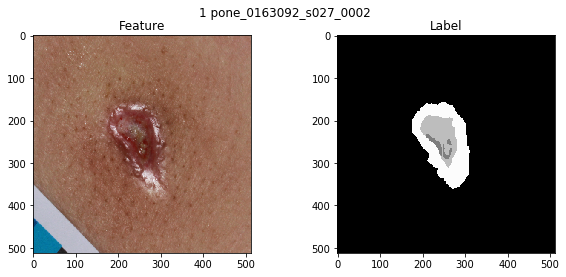

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/20120810_093836', '459']
[0 1 3 4]
[  0  63 189 252]


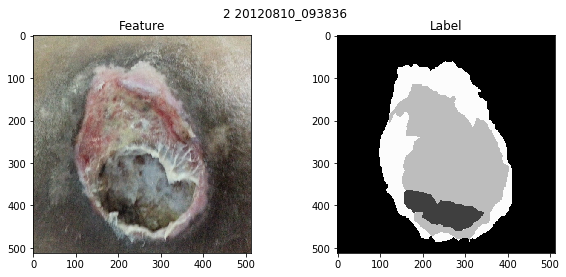

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s027_0000', '2002']
[0 2 3 4]
[  0 126 189 252]


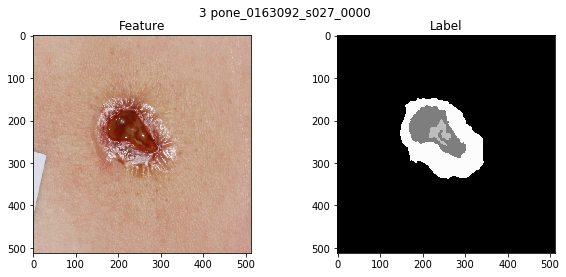

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s008_0003', '1719']
[0 2 3 4]
[  0 126 189 252]


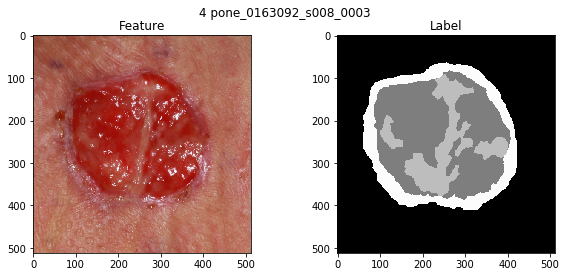

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_3140', '229']
[0 3 4]
[  0 189 252]


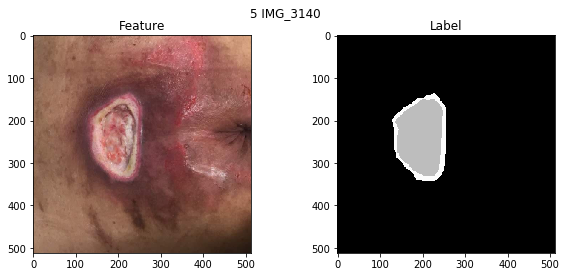

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pressure-ulcer-on-foot-0025', '699']
[0 1 3 4]
[  0  63 189 252]


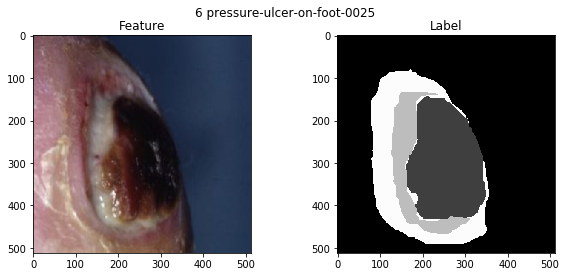

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s015_0003', '1870']
[0 2 3 4]
[  0 126 189 252]


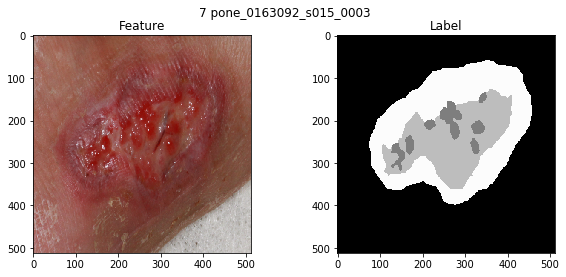

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pressure-ulcer-on-foot-0017', '923']
[0 1 4]
[  0  63 252]


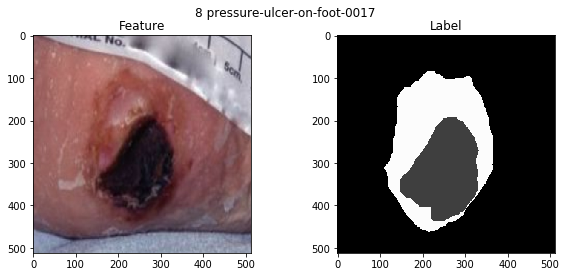

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/sloughy-pressure-ulcer-0028', '225']
[0 3 4]
[  0 189 252]


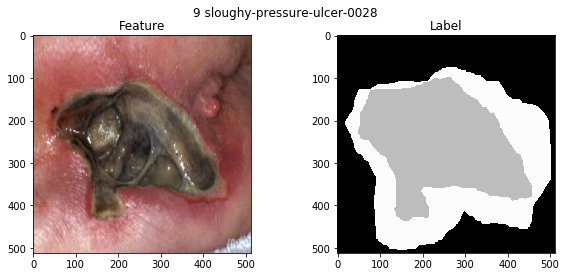

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_1960', '147']
[0 2 4]
[  0 126 252]


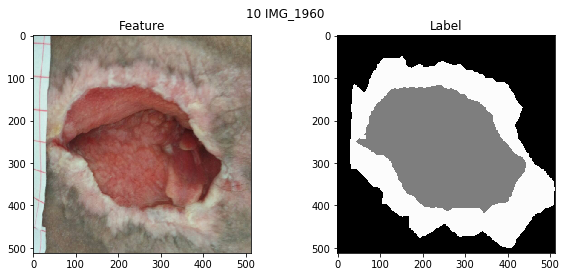

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s024_0000', '1708']
[0 2 3]
[  0 126 189]


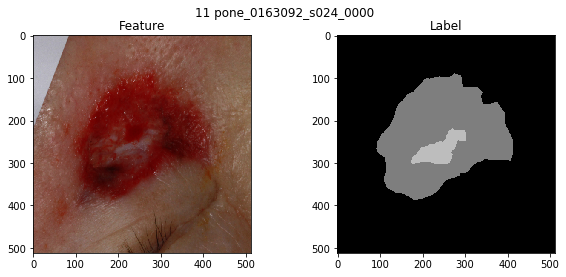

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s015_0000', '1263']
[0 1 2 3]
[  0  63 126 189]


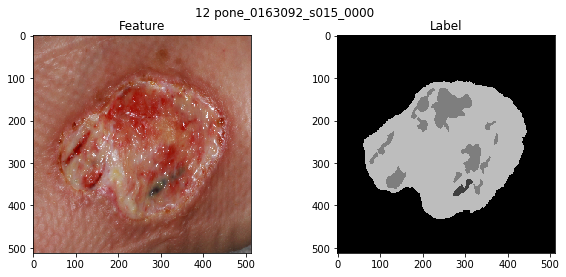

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s014_0000', '2583']
[0 2 3 4]
[  0 126 189 252]


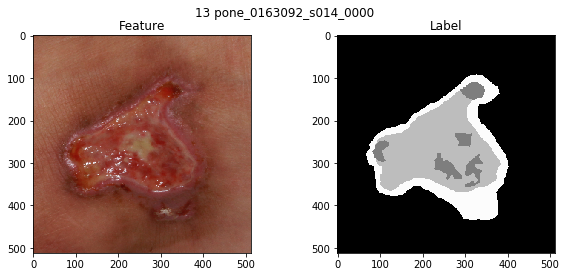

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/undermining0012', '971']
[0 2 3 4]
[  0 126 189 252]


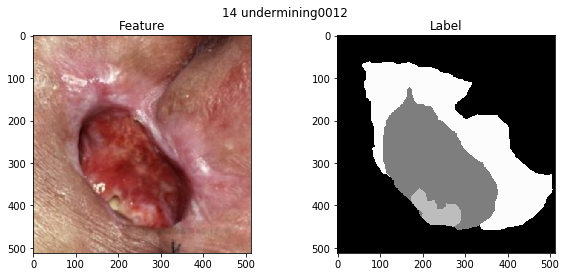

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pressure-ulcer-on-foot-0044', '816']
[0 2 3 4]
[  0 126 189 252]


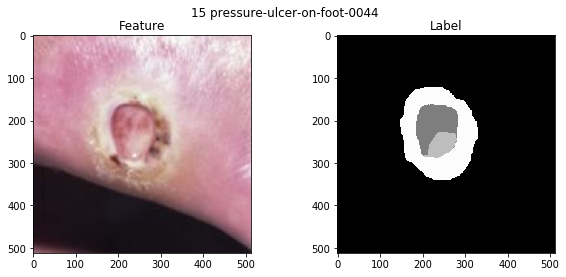

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/healing-pressure-ulcer-0006', '354']
[0 4]
[  0 252]


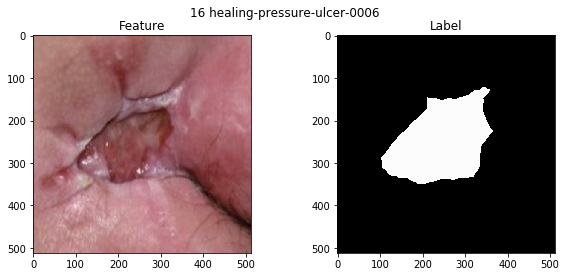

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/treating--pressure-ulcers008', '728']
[0 2 3 4]
[  0 126 252]


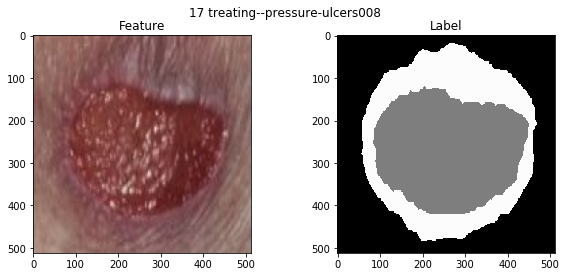

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/20150617_184107', '1043']
[0 1 3 4]
[  0  63 189 252]


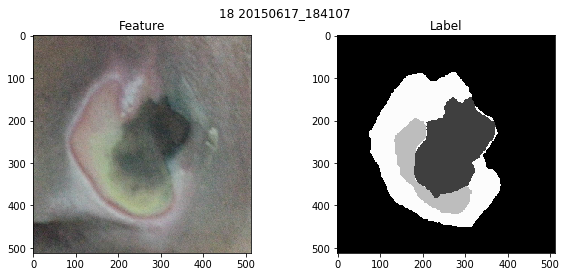

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_3381', '596']
[0 1 2 3]
[  0  63 126 189]


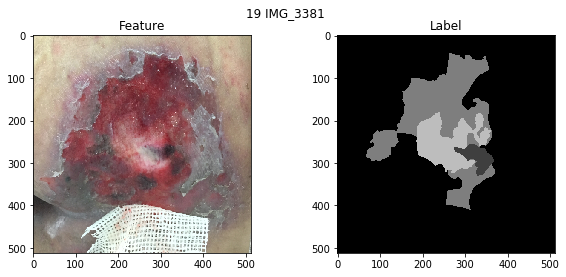

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s013_0000', '2531']
[0 1 2 3 4]
[  0  63 126 189 252]


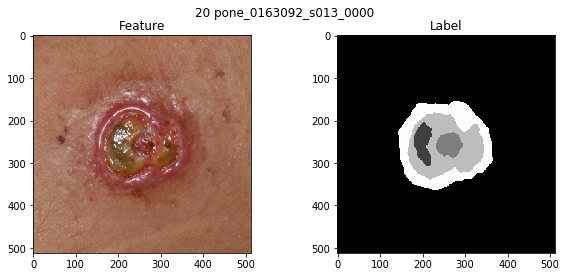

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_9481', '635']
[0 2 4]
[  0 126 252]


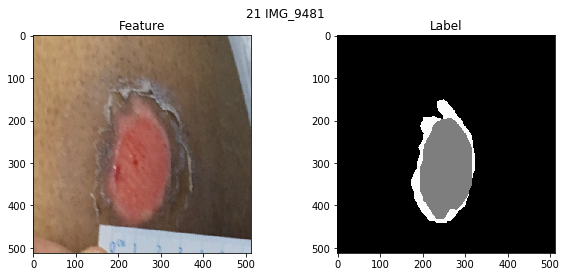

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s018_0001', '2166']
[0 2 3 4]
[  0 126 189 252]


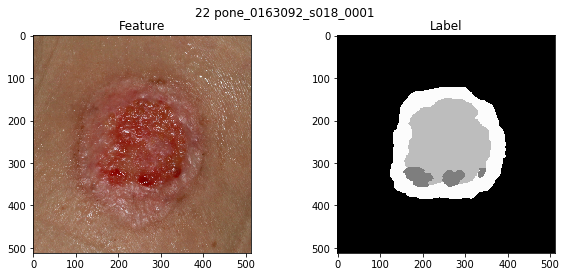

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/superficial-pressure-ulcer0011', '804']
[0 2 3 4]
[  0 126 189 252]


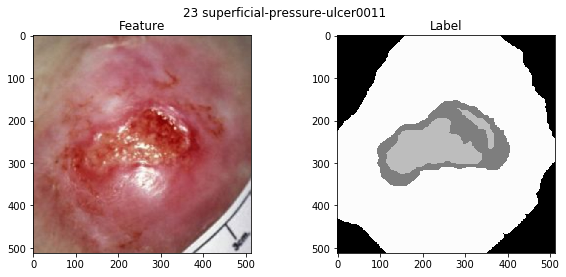

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/20120810_094619', '892']
[0 1 3]
[  0  63 189]


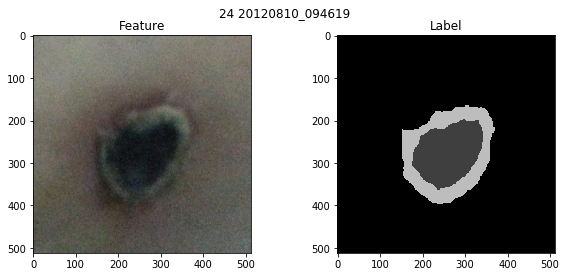

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s024_0001', '2524']
[0 2 3 4]
[  0 126 189 252]


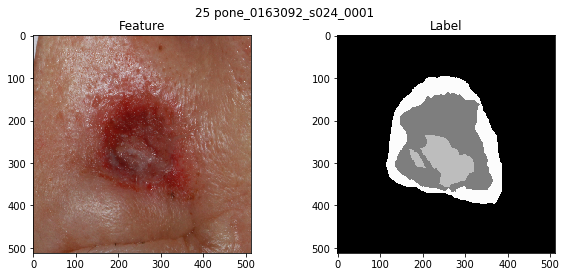

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/necrotic-pressure-ulcer-0005', '283']
[0 1 3 4]
[  0  63 189 252]


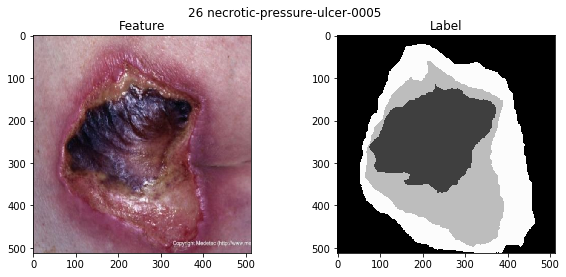

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pressure-ulcer-on-neck-003', '653']
[0 2 3 4]
[  0 126 189 252]


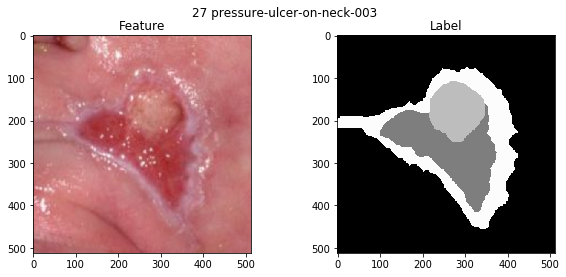

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/sloughy-pressure-ulcer-0013', '668']
[0 3 4]
[  0 189 252]


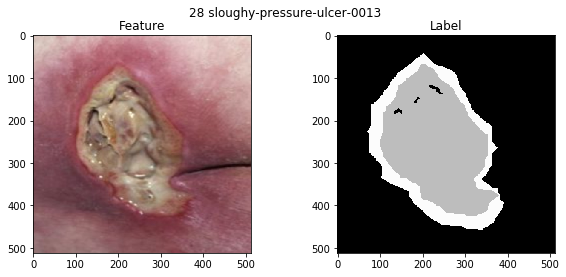

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/superficial-pressure-ulcer0013', '371']
[0 2 3 4]
[  0 126 189 252]


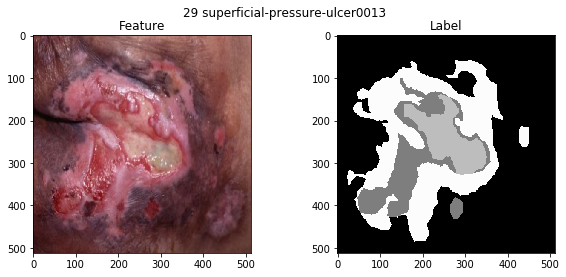

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s006_0002', '1623']
[0 2 3 4]
[  0 126 189 252]


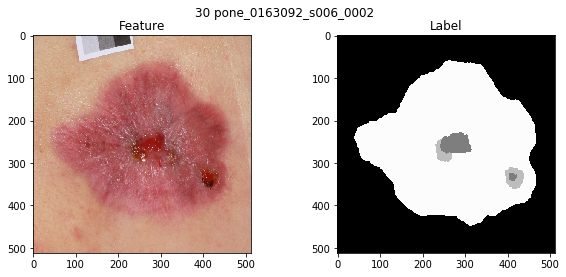

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/necrotic-pressure-ulcer-0002', '547']
[0 1 4]
[  0  63 252]


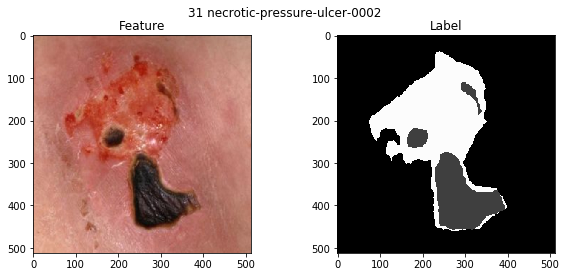

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_0912', '331']
[0 3 4]
[  0 189 252]


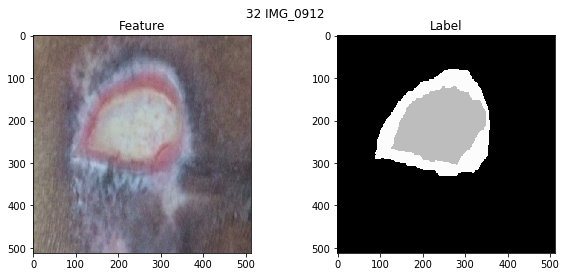

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/undermining0020', '615']
[0 2 3 4]
[  0 126 189 252]


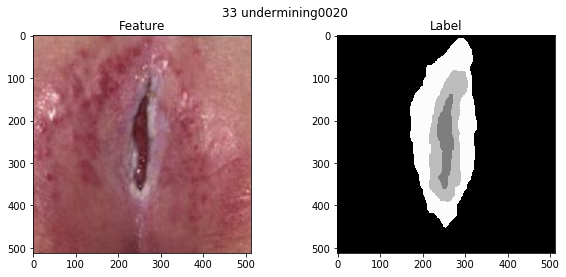

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s007_0005', '1767']
[0 2 3 4]
[  0 126 189 252]


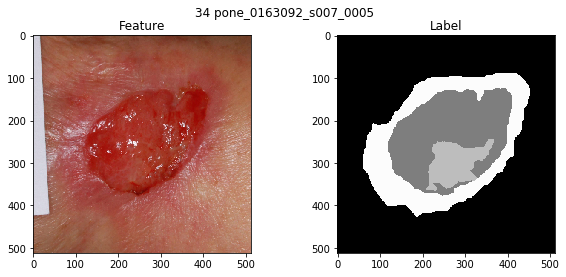

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s001_0006', '602']
[0 2 3 4]
[  0 126 189 252]


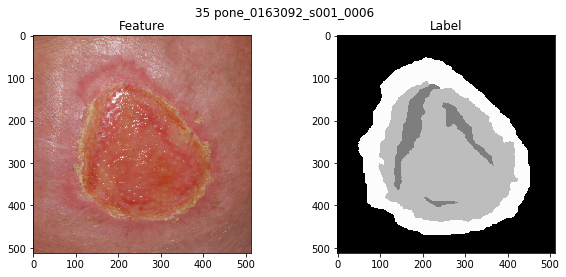

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/undermining0019', '760']
[0 3 4]
[  0 189 252]


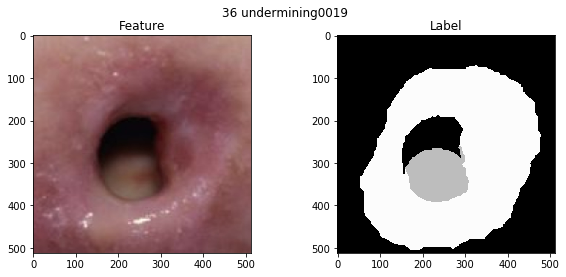

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pressure-ulcer-on-foot-0027', '726']
[0 1 2 3 4]
[  0  63 126 189 252]


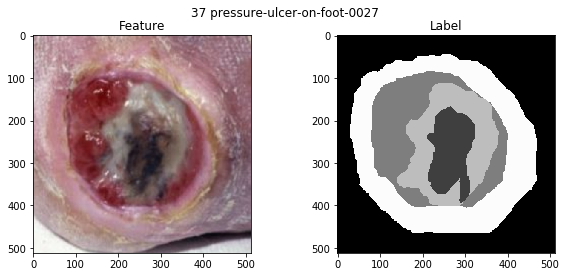

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s010_0001', '2531']
[0 2 4]
[  0 126 252]


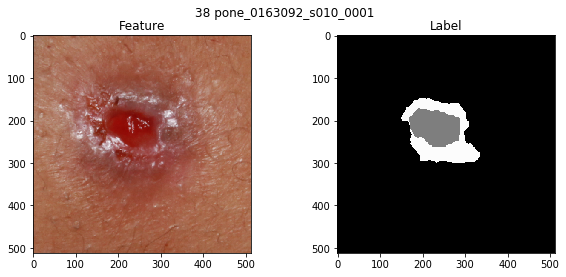

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pressure-ulcer-on-foot-0050', '486']
[0 2 3]
[  0 126 189]


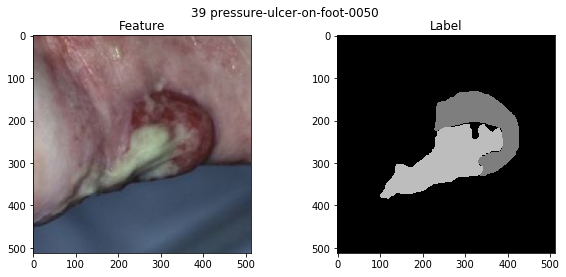

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/undermining0016', '841']
[0 2 3 4]
[  0 126 189 252]


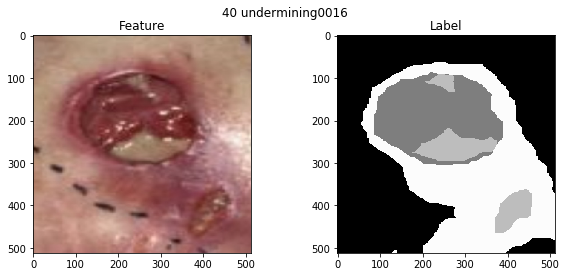

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/healing-pressure-ulcer-0027', '72']
[0 1 2 3 4]
[  0  63 126 189 252]


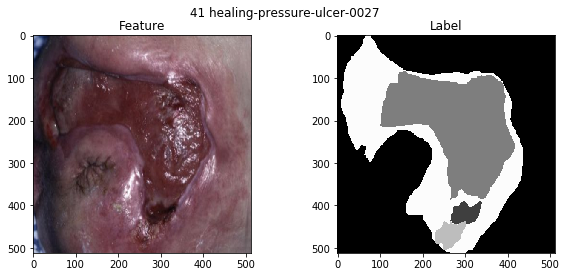

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/healing-pressure-ulcer-0004', '195']
[0 2 4]
[  0 126 252]


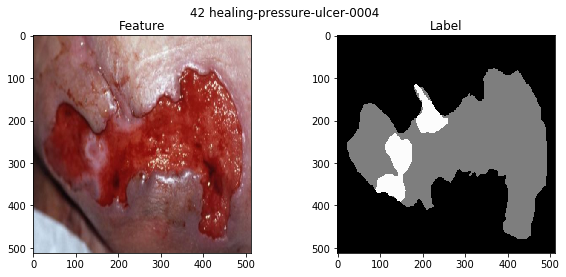

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s024_0002', '1899']
[0 2 3 4]
[  0 126 189 252]


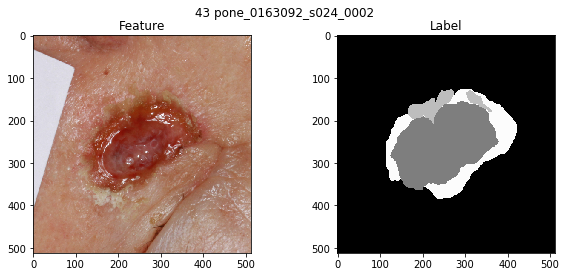

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s030_0002', '2502']
[0 2 3]
[  0 126 189]


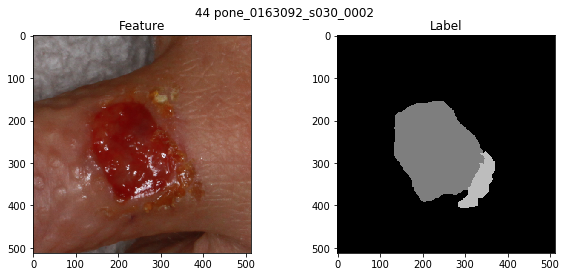

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/healing-pressure-ulcer-0018', '195']
[0 1 2 4]
[  0  63 126 252]


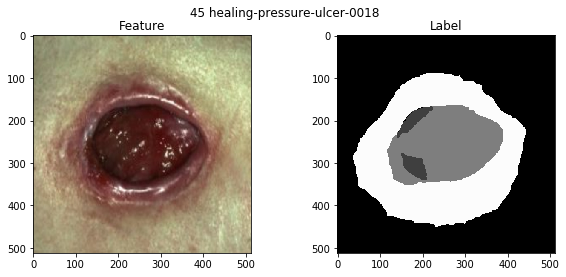

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/sloughy-pressure-ulcer-0026', '230']
[0 3 4]
[  0 189 252]


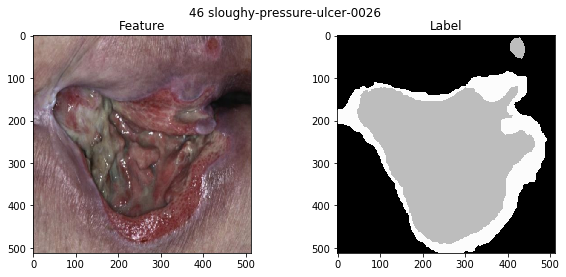

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_3441', '519']
[0 1 2 4]
[  0  63 126 252]


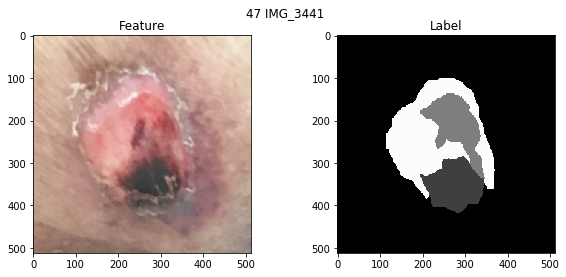

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pressure-ulcer-on-foot-0039', '124']
[0 1 3]
[  0  63 189]


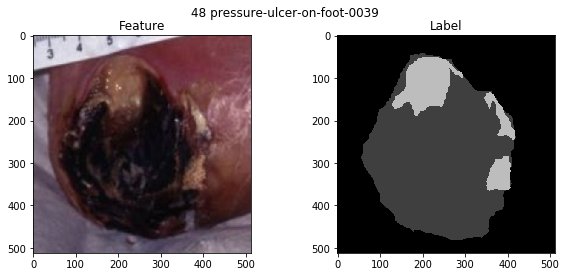

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_1270', '129']
[0 1 2]
[  0  63 126]


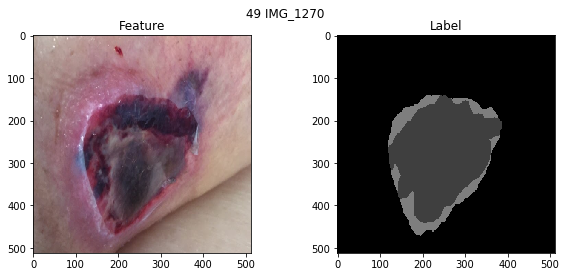

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/sloughy-pressure-ulcer-0037', '715']
[0 3 4]
[  0 189 252]


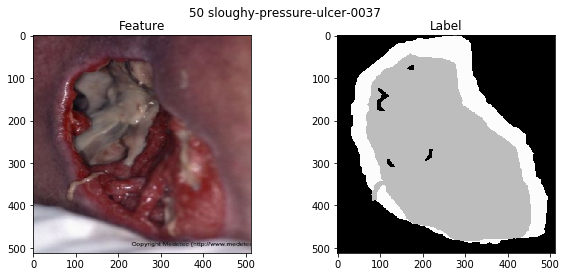

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s016_0001', '559']
[0 2 4]
[  0 126 252]


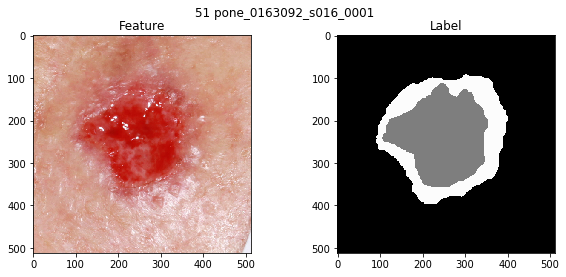

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/sloughy-pressure-ulcer-0001', '700']
[0 3 4]
[  0 189 252]


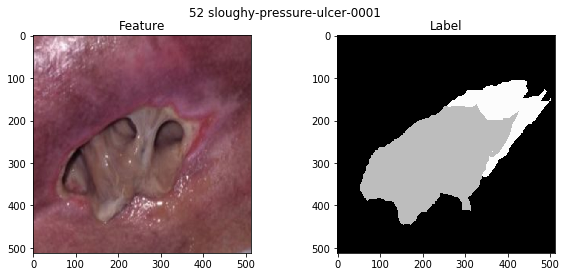

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/healing-pressure-ulcer-0025', '280']
[0 1 2 3 4]
[  0  63 126 189 252]


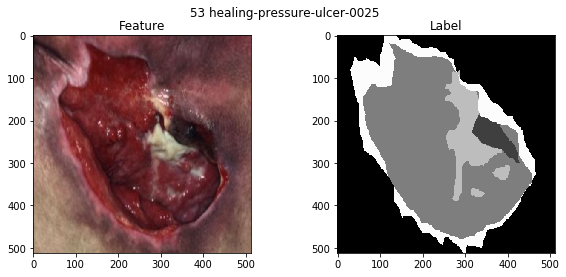

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_3121', '544']
[0 3 4]
[  0 189 252]


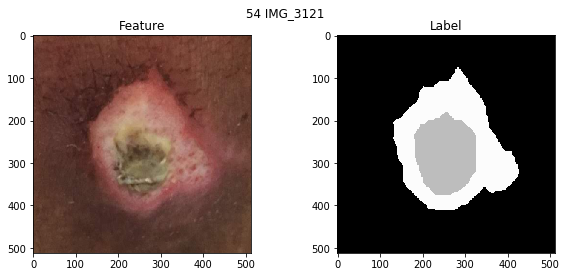

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_9479', '1643']
[0 2 4]
[  0 126 252]


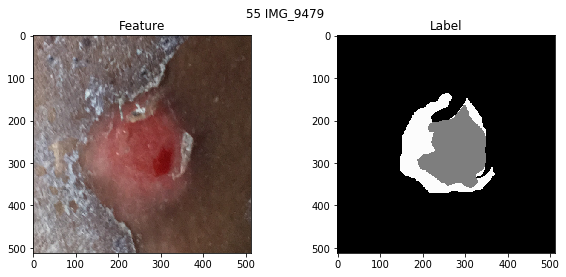

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_0914', '369']
[0 2 3]
[  0 126 189]


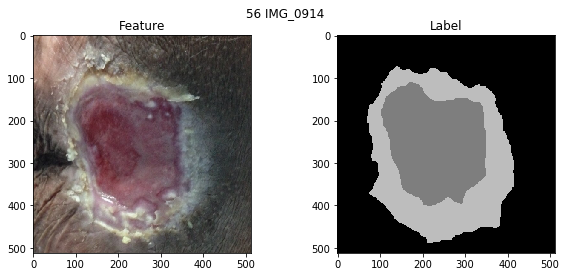

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s023_0003', '2123']
[0 2 3 4]
[  0 126 189 252]


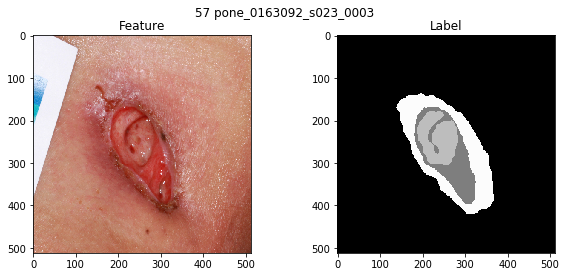

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s011_0001', '2241']
[0 1 2 3 4]
[  0  63 126 189 252]


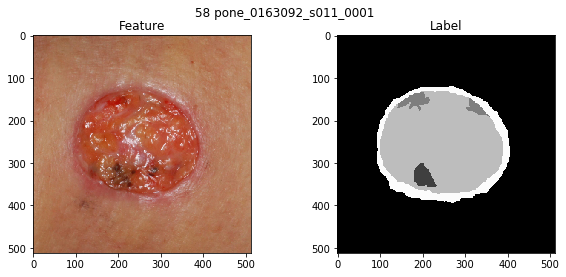

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/healing-pressure-ulcer-0014', '215']
[0 1 2 3 4]
[  0  63 126 189 252]


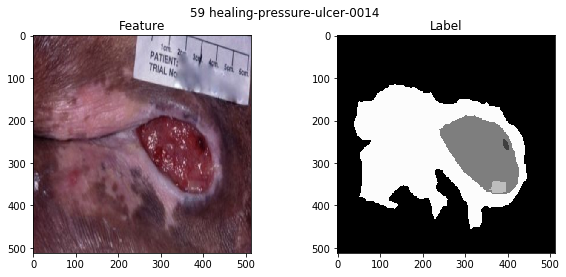

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s009_0000', '1767']
[0 2 3 4]
[  0 126 189 252]


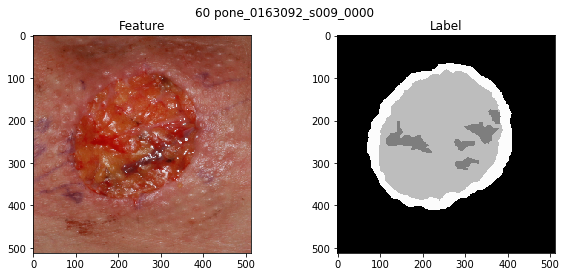

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s015_0001', '2509']
[0 2 3 4]
[  0 126 189 252]


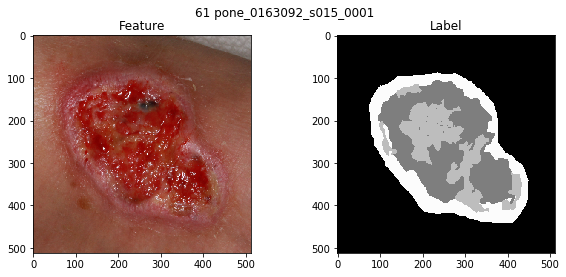

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s007_0001', '1219']
[0 2 3 4]
[  0 126 189 252]


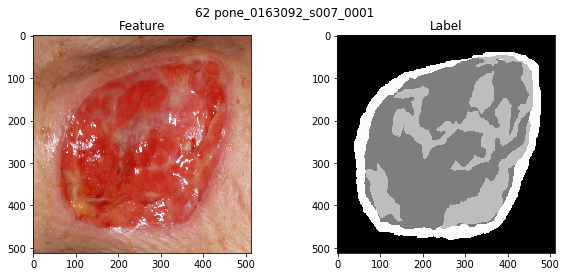

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s012_0000', '2116']
[0 2 3 4]
[  0 126 189 252]


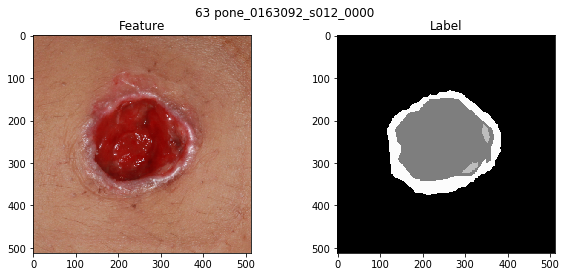

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pressure-ulcer-on-foot-0051', '300']
[0 2 3 4]
[  0 126 189 252]


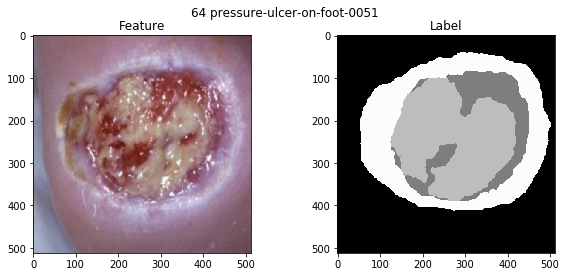

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_4814', '1157']
[0 1 2 3 4]
[  0  63 126 189 252]


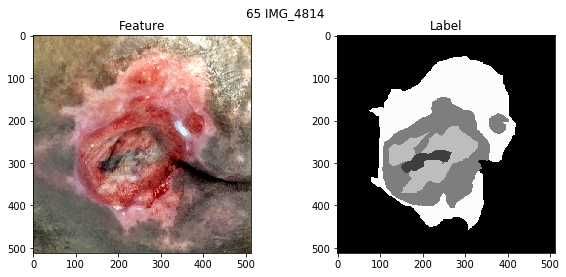

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s029_0002', '2101']
[0 1 2 3 4]
[  0  63 126 189 252]


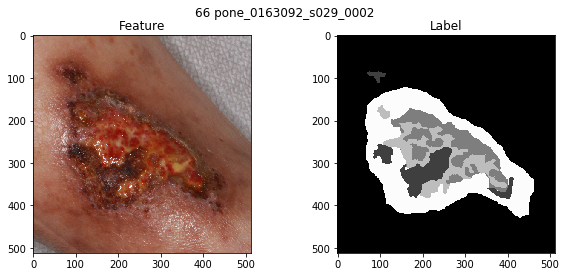

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s020_0001', '2383']
[0 2 3]
[  0 126 189]


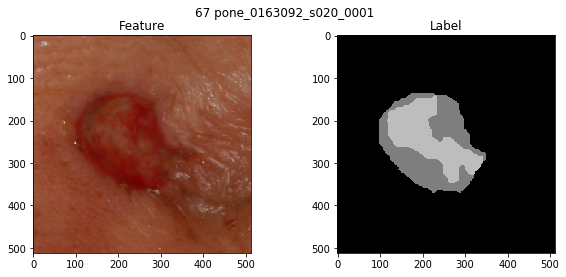

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pone_0163092_s014_0006', '2325']
[0 2]
[  0 126]


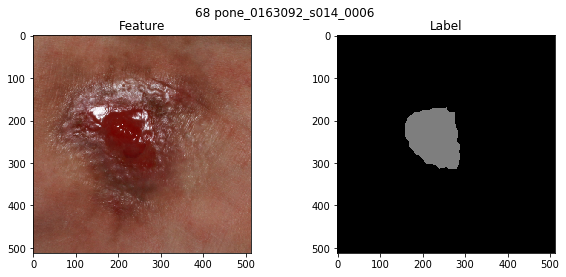

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/pressure-ulcer-on-foot-0026', '1248']
[0 3 4]
[  0 189 252]


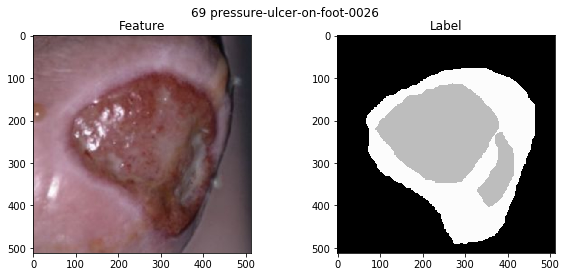

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_3321', '1364']
[0 3 4]
[  0 189 252]


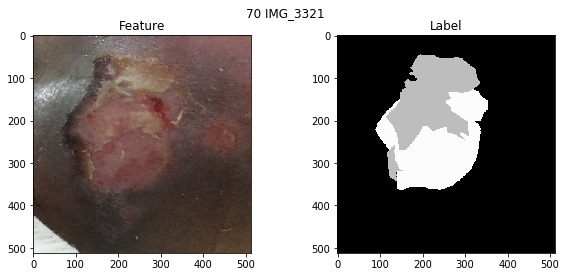

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/healing0038', '635']
[0 3]
[  0 189]


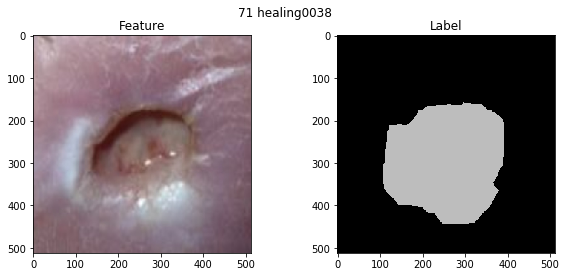

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/undermining0002', '614']
[0 2 4]
[  0 126 252]


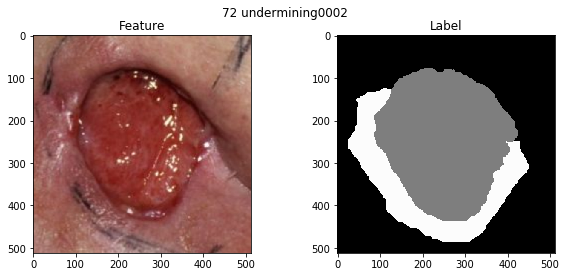

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/sloughy-pressure-ulcer-0022', '259']
[0 3 4]
[  0 189 252]


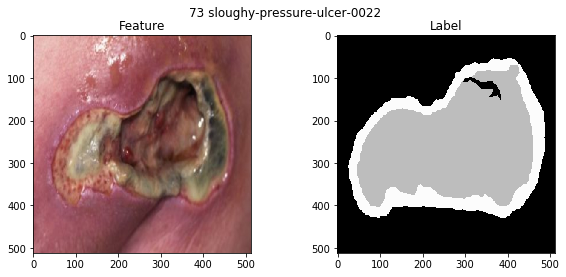

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_1959', '230']
[0 2 4]
[  0 126 252]


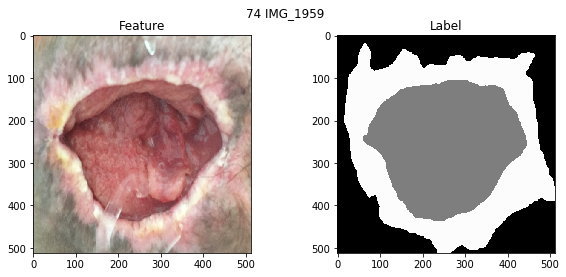

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/healing-pressure-ulcer-0002', '130']
[0 2 3 4]
[  0 126 189 252]


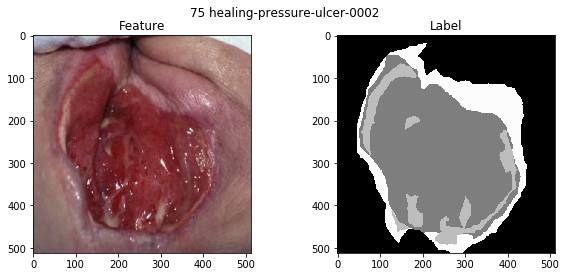

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/20120810_114621', '79']
[0 3 4]
[  0 189 252]


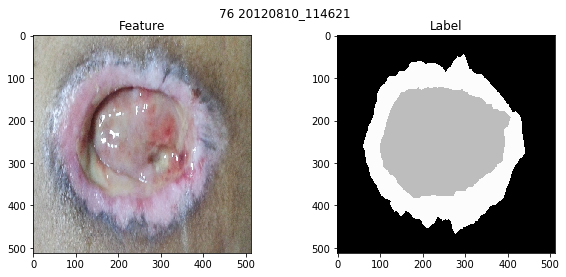

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_3353', '226']
[0 2 3 4]
[  0 126 189 252]


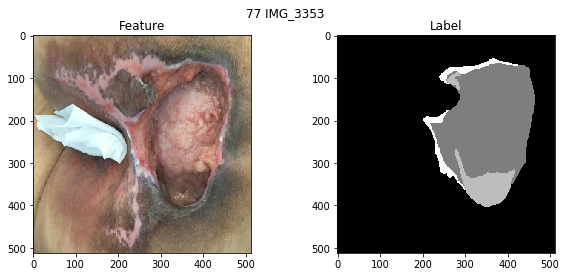

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/necrotic-pressure-ulcer-0011', '616']
[0 1 2]
[  0  63 126]


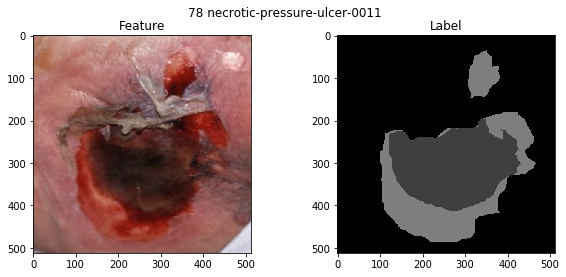

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/healing-pressure-ulcer-0019', '179']
[0 2 3 4]
[  0 126 189 252]


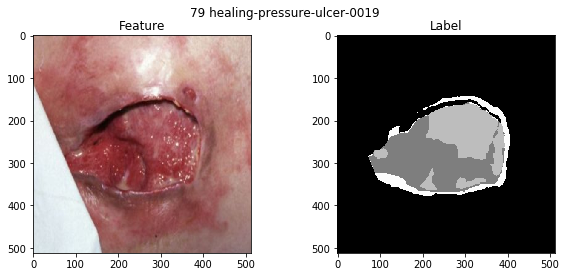

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/sloughy-pressure-ulcer-0005', '900']
[0 3 4]
[  0 189 252]


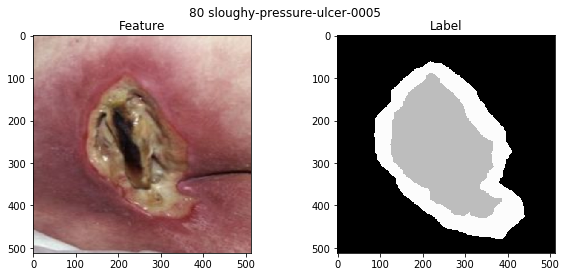

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/undermining0006', '841']
[0 3 4]
[  0 189 252]


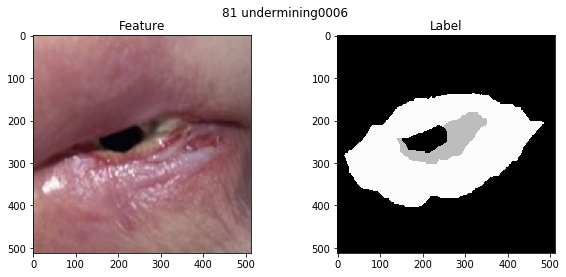

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_25570207_100924', '925']
[0 2 3 4]
[  0 126 189 252]


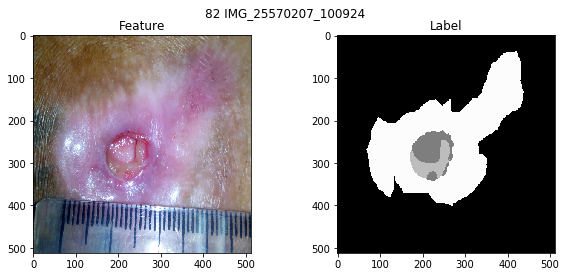

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/IMG_3609', '219']
[0 1 2 3 4]
[  0  63 126 189 252]


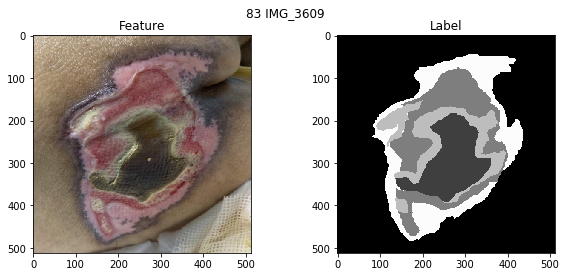

['/notebooks/home_1TB/data/wound_rajavithi_korean_medetec/wound_segmentation/wound_tissue/multimask/20121224_144834', '218']
[0 1 2 3]
[  0  63 126 189]


In [ ]:
create_dataset(training_csv, training, training_feature_dir, training_label_dir, prediction_csv, augment_color)
# check_dataset(training_feature_dir, training_label_dir)

### Pre-Process Testing Data

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0001_1', '218']
[0 2 4]
[  0 126 252]


/root/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:269: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


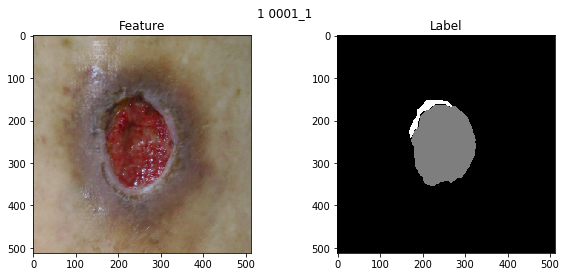

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0002_3', '330']
[0 2 4]
[  0 126 252]


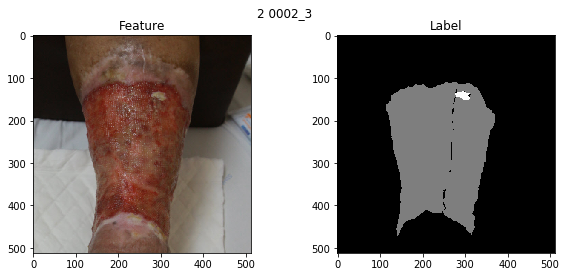

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0002_4', '213']
[0 2 4]
[  0 126 252]


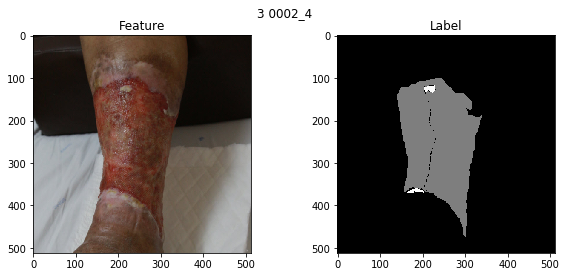

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0003_5', '638']
[0 1 2 4]
[  0  63 126 252]


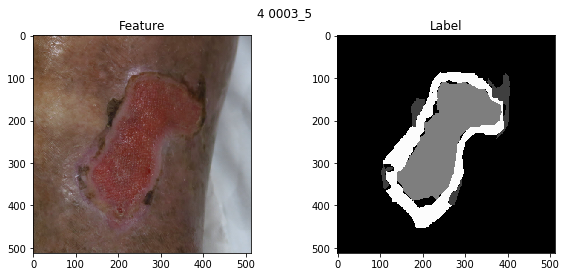

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0002_2', '266']
[0 2 4]
[  0 126 252]


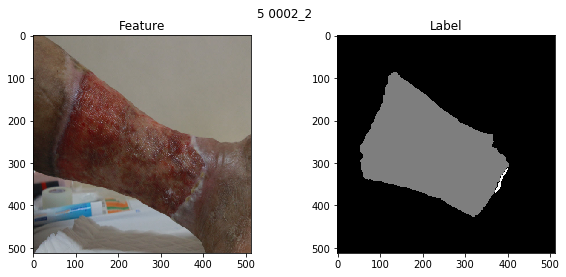

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0005_9', '657']
[0 2 4]
[  0 126 252]


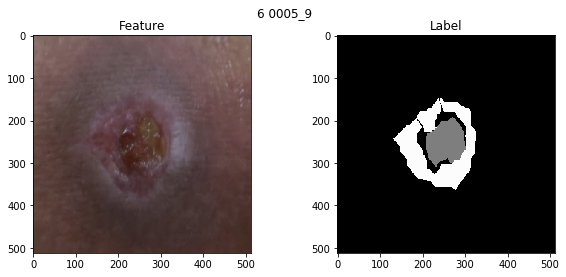

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0005_8', '646']
[0 2 3]
[  0 126 189]


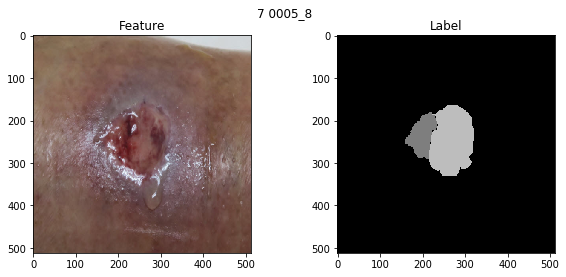

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0004_6', '358']
[0 2 3]
[  0 126 189]


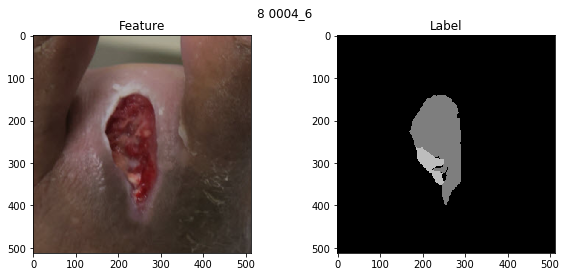

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0004_7', '442']
[0 2 3 4]
[  0 126 189 252]


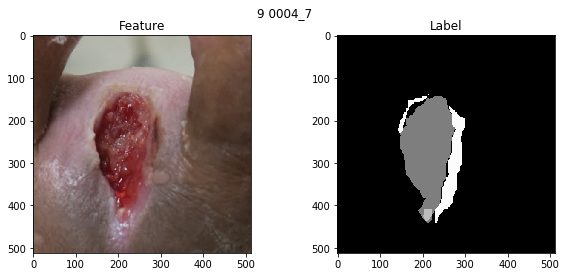

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0006_10', '826']
[0 2 3]
[  0 126 189]


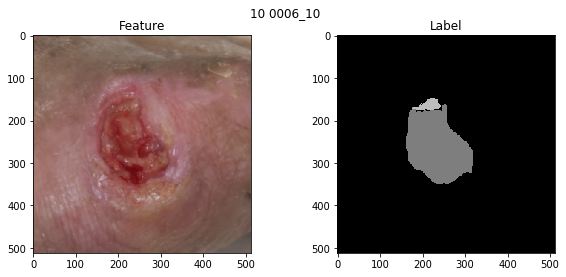

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0008_13', '362']
[0 2 3 4]
[  0 126 189 252]


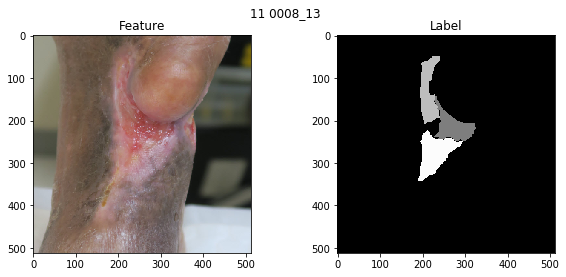

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0009_15', '960']
[0 1 2 3]
[  0  63 126 189]


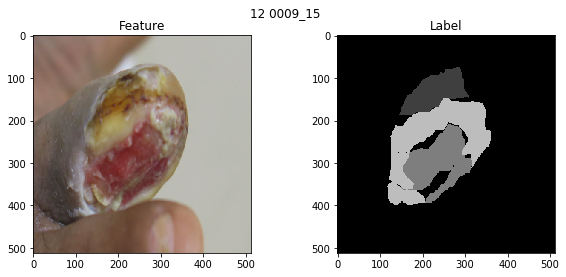

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0008_14', '192']
[0 2 3]
[  0 126 189]


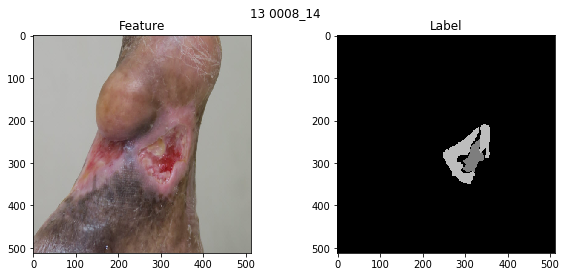

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0007_12', '257']
[0 2 4]
[  0 126 252]


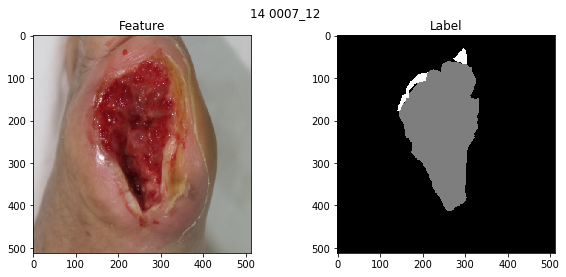

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0007_11', '565']
[0 1 2 4]
[  0  63 126 252]


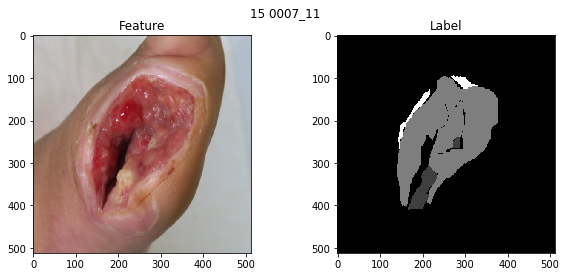

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0011_18', '274']
[0 1 2 3 4]
[  0  63 126 189 252]


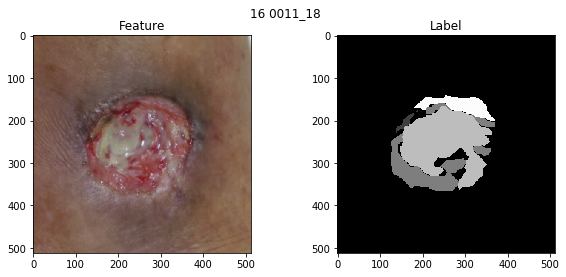

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0011_19', '618']
[0 2 4]
[  0 126 252]


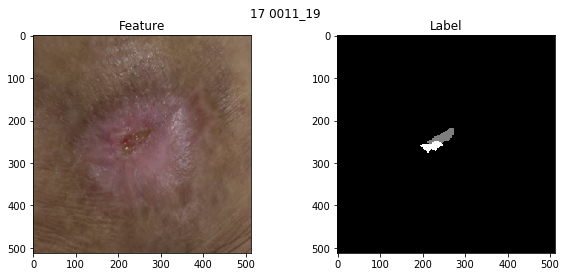

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0010_16', '0']
[0 2]
[  0 126]


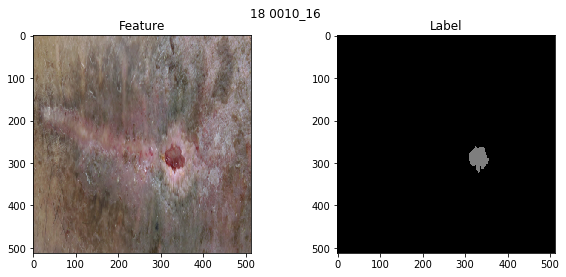

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0012_20', '502']
[0 2 3 4]
[  0 126 189 252]


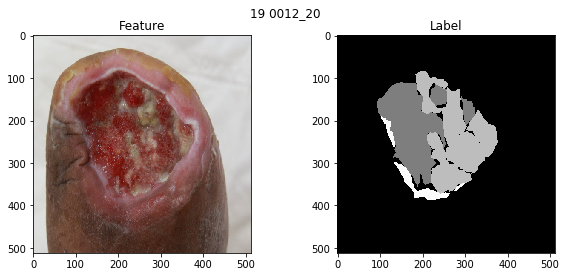

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0010_17', '176']
[0 2]
[  0 126]


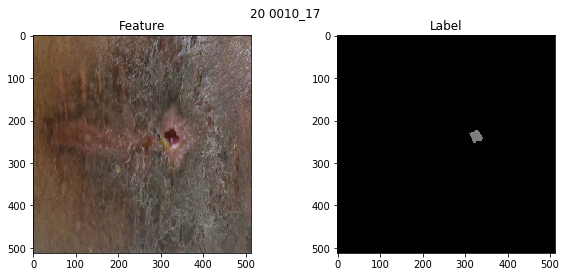

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0012_23', '707']
[0 2 3 4]
[  0 126 189 252]


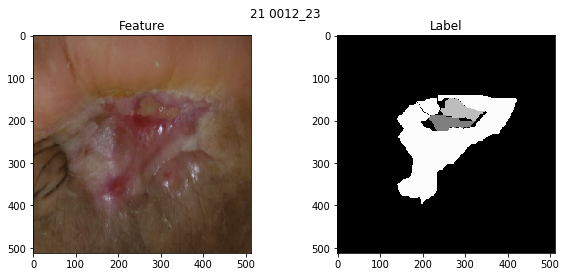

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0013_26', '182']
[0 2 4]
[  0 126 252]


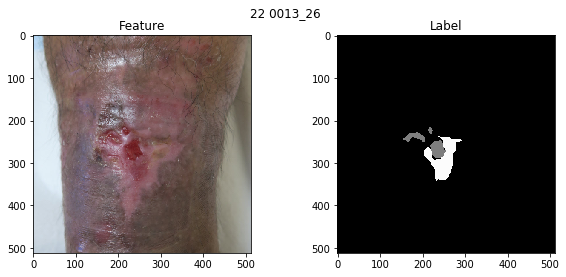

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0012_22', '364']
[0 2 3 4]
[  0 126 189 252]


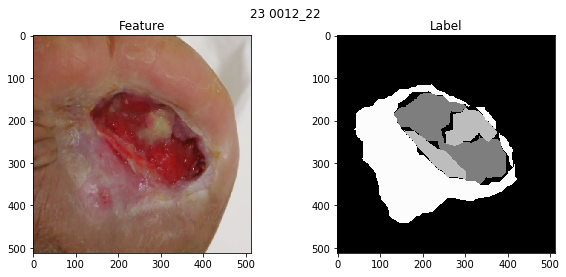

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0012_21', '174']
[0 2 3 4]
[  0 126 189 252]


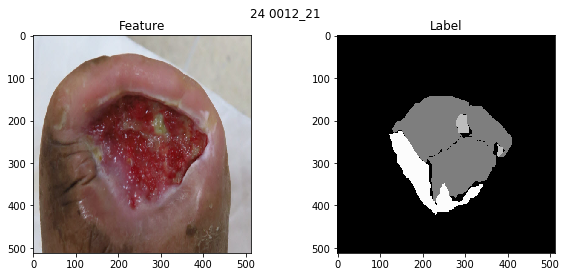

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0013_24', '199']
[0 1 2 4]
[  0  63 126 252]


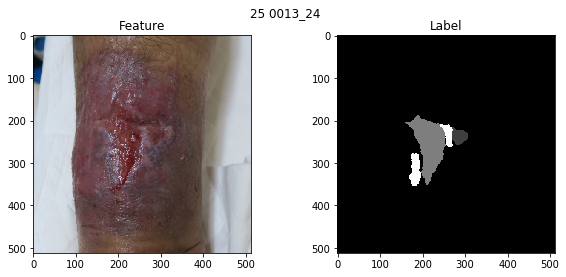

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0014_27', '361']
[0 1 3]
[  0  63 189]


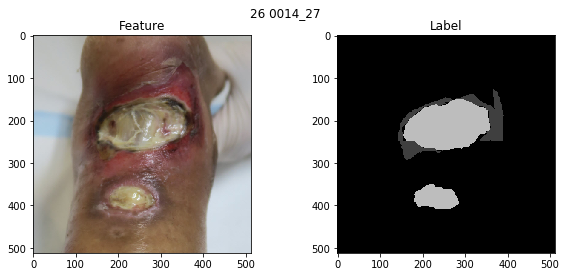

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0015_29', '597']
[0 3]
[  0 189]


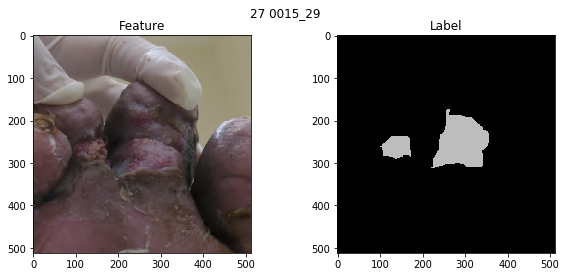

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0014_28', '491']
[0 2 3]
[  0 126 189]


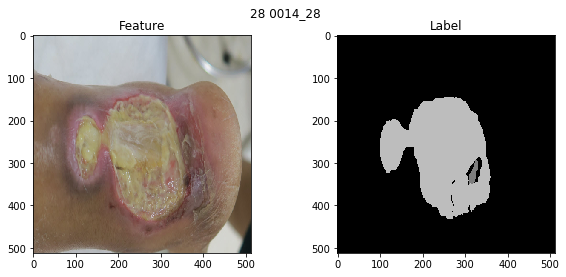

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0016_30', '624']
[0 2 3 4]
[  0 126 189 252]


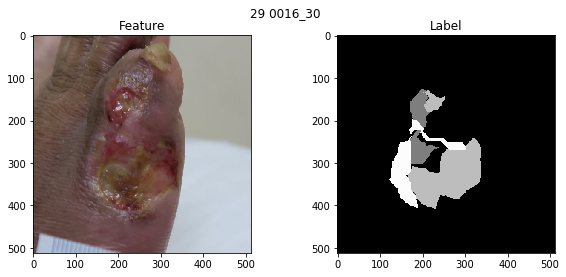

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0016_31', '739']
[0 2 3]
[  0 126 189]


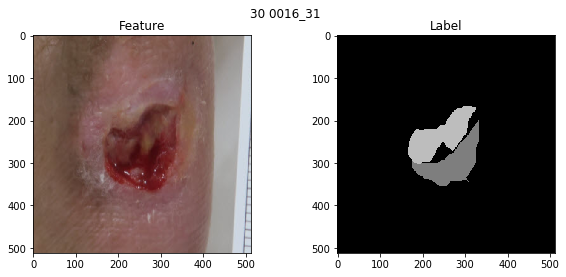

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0016_33', '562']
[0 2 4]
[  0 126 252]


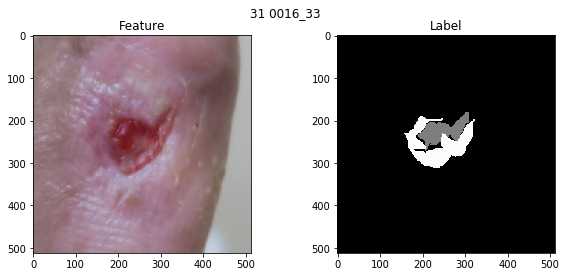

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0013_25', '478']
[0 2]
[  0 126]


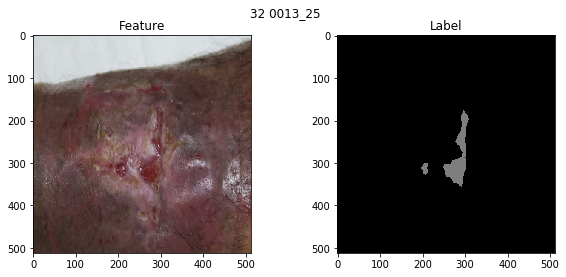

['/notebooks/home_1TB/data/wound_rama/wound_segmentation/wound_tissue/multimask/0016_32', '340']
[0 3]
[  0 189]


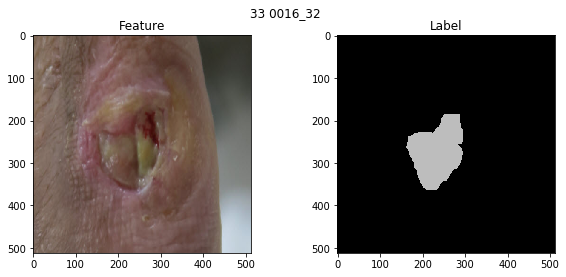

[]


In [17]:
create_dataset(testing_csv, testing, testing_feature_dir, testing_label_dir, prediction_csv, augment_color)
# check_dataset(testing_feature_dir, testing_label_dir)